In [1]:
from __future__ import print_function, division

import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import numpy as np
import torchvision
from torchvision import datasets, models, transforms
import matplotlib.pyplot as plt
import time
import os
import copy
from glob import glob
from sklearn.metrics import roc_auc_score
import warnings

warnings.simplefilter('ignore')


device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)
print(torch.cuda.get_device_name())

cuda:0
NVIDIA GeForce RTX 3060 Laptop GPU


In [6]:
data_transforms = {
    'train': transforms.Compose([
        transforms.RandomResizedCrop(256),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'val': transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(256),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'test': transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(256),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}

data_dir = 'C:/Users/mehmu/Desktop/PyProjects/Projects/github repo/BreastCancer/Second Dataset/output'
image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x),
                                        data_transforms[x])
                    for x in ['train', 'val','test']}
dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=64,
                                            shuffle=True, num_workers=4)
                    for x in ['train', 'val','test']}

dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'val','test']}
class_names = image_datasets['train'].classes


In [15]:
def imshow(inp, title=None):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.figure(figsize=(40,40))
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated

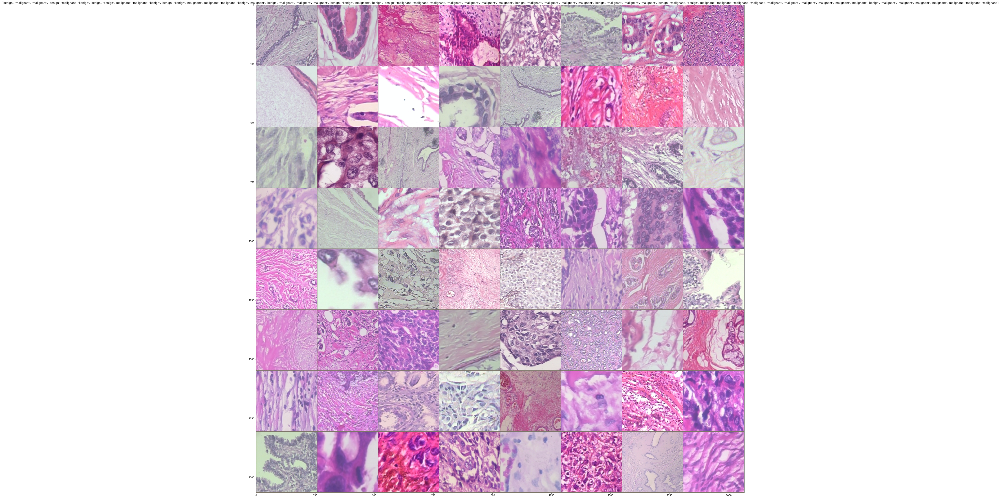

In [16]:
# Get a batch of training data
inputs, classes = next(iter(dataloaders['train']))

# Make a grid from batch
out = torchvision.utils.make_grid(inputs)

imshow(out, title=[class_names[x] for x in classes])

In [17]:
def train_model(model, criterion, optimizer, scheduler, num_epochs=30):
    since = time.time()
    
    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0
            running_auc=0.0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)

                    loss = criterion(outputs, labels)

                    
                    #auc=roc_auc_score(outputs.cpu().max(1)[1],labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                #running_auc +=auc.item() * inputs.size(0)
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
            if phase == 'train':
                scheduler.step()
            #epoch_auc = running_auc / dataset_sizes[phase]
            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            #AUC: {:.4f}, epoch_auc
            print('{} Loss: {:.4f} Acc: {:.4f} '.format(        
                phase, epoch_loss, epoch_acc))

            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())

        print()

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [18]:
model_ft = models.resnet18(pretrained=True)
num_ftrs = model_ft.fc.in_features
# Here the size of each output sample is set to 6.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
model_ft.fc = nn.Linear(num_ftrs, len(class_names))

model_ft = model_ft.to(device)

criterion = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ft = optim.SGD(model_ft.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)



model_ft = train_model(model_ft, criterion, optimizer_ft, exp_lr_scheduler,
                        num_epochs=25)

Epoch 0/24
----------
train Loss: 0.4026 Acc: 0.8244 
val Loss: 0.2526 Acc: 0.9005 

Epoch 1/24
----------
train Loss: 0.2341 Acc: 0.9092 
val Loss: 0.1719 Acc: 0.9348 

Epoch 2/24
----------
train Loss: 0.1792 Acc: 0.9298 
val Loss: 0.1337 Acc: 0.9485 

Epoch 3/24
----------
train Loss: 0.1569 Acc: 0.9371 
val Loss: 0.1105 Acc: 0.9554 

Epoch 4/24
----------
train Loss: 0.1390 Acc: 0.9447 
val Loss: 0.0945 Acc: 0.9588 

Epoch 5/24
----------
train Loss: 0.1206 Acc: 0.9531 
val Loss: 0.0889 Acc: 0.9623 

Epoch 6/24
----------
train Loss: 0.1092 Acc: 0.9601 
val Loss: 0.0925 Acc: 0.9588 

Epoch 7/24
----------
train Loss: 0.0943 Acc: 0.9640 
val Loss: 0.0814 Acc: 0.9700 

Epoch 8/24
----------
train Loss: 0.0913 Acc: 0.9680 
val Loss: 0.0819 Acc: 0.9657 

Epoch 9/24
----------
train Loss: 0.0928 Acc: 0.9645 
val Loss: 0.0817 Acc: 0.9648 

Epoch 10/24
----------
train Loss: 0.0872 Acc: 0.9645 
val Loss: 0.0807 Acc: 0.9657 

Epoch 11/24
----------
train Loss: 0.0849 Acc: 0.9671 
val Loss:

In [19]:
torch.save(model_ft, 'bcancer_model_30epoch-0.9699acc.h5')

In [20]:
def visualize_model(model, num_images=6):
    was_training = model.training
    model.eval()
    images_so_far = 0
    fig = plt.figure()

    with torch.no_grad():
        for i, (inputs, labels) in enumerate(dataloaders['val']):
            print(i)
            print([inputs,labels])
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                images_so_far += 1
                ax = plt.subplot(num_images//2, 2, images_so_far)
                ax.axis('off')
                ax.set_title('predicted: {}'.format(class_names[preds[j]]))
                imshow(inputs.cpu().data[j])

                if images_so_far == num_images:
                    model.train(mode=was_training)
                    return
        model.train(mode=was_training)

In [5]:
model_ft=torch.load('bcancer_model_30epoch-0.9699acc.h5')

In [5]:
inputs.size()

torch.Size([64, 3, 50, 50])

In [6]:
model_ft.eval()
pred=model_ft(inputs.to(device)).max(1)[1]


In [21]:
import pandas as pd
from sklearn.metrics import f1_score,accuracy_score,recall_score,roc_auc_score

df=pd.DataFrame(columns=['f1','accuracy_score','recall_score','AUC'])

for _ in range(12):
    inputs, classes = next(iter(dataloaders['test']))
    model_ft.eval()
    pred=model_ft(inputs.to(device)).max(1)[1]
    f=f1_score(pred.cpu(),classes)
    a=accuracy_score(pred.cpu(),classes)
    r=recall_score(pred.cpu(),classes)
    auc=roc_auc_score(pred.cpu(),classes)
    df.loc[len(df.index)]=[f,a,r,auc]

df

,f1,accuracy_score,recall_score,AUC
0,0.975610,0.968750,1.000000,0.958333
1,0.987013,0.984375,0.974359,0.987179
2,0.987654,0.984375,1.000000,0.979167
3,0.965517,0.953125,0.933333,0.966667
4,0.946237,0.921875,0.956522,0.894928
5,0.961039,0.953125,0.948718,0.954359
6,0.970297,0.953125,0.960784,0.941931
7,0.927536,0.921875,0.914286,0.922660
8,0.976744,0.968750,0.976744,0.964563
9,0.987342,0.984375,1.000000,0.980000


In [22]:
print('f1: ', df.f1.mean())
print('accuracy_score: ', df.accuracy_score.mean())
print('recall: ', df.recall_score.mean())
print('AUC: ', df.AUC.mean())

f1:  0.9698647149430863
accuracy_score:  0.9609375
recall:  0.9702103322813488
AUC:  0.9558910319435548
